# 9. Urban accessibility: measures and techniques

In this project, we will attempt to develop an **urban accessibility measure** based on free open-source data about public amenities in cities from [OpenStreetMap](https://www.openstreetmap.org/), as well as high-resolution population density data from the NASA [Socioeconomic Data and Applications Center](https://sedac.ciesin.columbia.edu/data/collection/gpw-v4/sets/browse). The developed accessibility measure will then be applied to analyse, visualise, and compare several cities, as a demonstration of its potential utility as a real-world decision-making tool.

The workflow of the project is as follows: 

* We will load the population grid raster data into Python;
* combine it with the given city's street network and public amenity OpenStreetMap vector data by 
* aggregating information from the raster into the latter with zonal statistics;
* devise a correlation measure between the spatial distribution of population density and the underlying street network density;
* develop an **urban accessibility measure** weighted (corrected) by population density.
* compare the developed urban accessibility measure to the classical approach.

The main contribution and novelty of the project is the combination of population _raster_ data and street network and public amenity _vector_ data, and the modification of typical accessibility measures used in urban analysis so as to account for the population a given public amenity is _actually_ accessible for. For instance, a restaurant accessible to 500 people in a neighbourhood is very different from the same restaurant accessible to 5000 people within the same distance.

Let's start by loading the required libraries.

In [1]:
# %install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, MultiPoint
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx
import rasterio

In [2]:
# in case of encountering problems with GEOS or GDAL, disable speedups from shapely
from shapely import speedups
speedups.disable()

Let's load an example city we are going to work with:

Milan coordinate reference system:  epsg:4326
Projected Milan coordinate reference system:  +proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


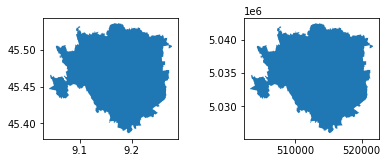

In [3]:
# load Milan city from openstreetmap using osmmnx api

city_name = 'Milan, Italy'
city = ox.geocode_to_gdf(city_name)
print('Milan coordinate reference system: ', city.crs)

# project to the local coordinate reference system
city_proj = ox.projection.project_gdf(city)
print('Projected Milan coordinate reference system: ', city_proj.crs)

fig, (ax1, ax2) = plt.subplots(1, 2)
city.plot(ax=ax1, ec='none')
city_proj.plot(ax=ax2, ec='none' )
plt.tight_layout(pad=3.0)
plt.show()

In [4]:
# convert to "ESRI:54009" coordinate system, since that's the system NASA uses
city = city.to_crs("ESRI:54009") 
print(city.crs)

ESRI:54009


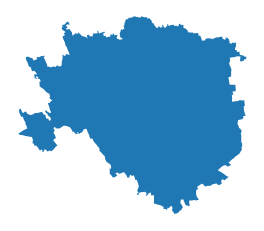

In [5]:
# plot city in new projection
ax = city.plot(ec='none')
_ = ax.axis('off')

In [6]:
# save to file
city.to_file('../data/Milan_54009.shp')

<ipython-input-6-f807795aa9f6>:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file('../data/Milan_54009.shp')


In [7]:
# load the saved file
import fiona
with fiona.open("../data/Milan_54009.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

### Population density

Now, let's load the global gridded population density file and extract the part of the data set corresponding to our city:

In [8]:
# load the NASA population density raster file
# Data source: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4
import rasterio.mask
with rasterio.open("../data/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0.tif") as src:
    # since the NASA data is for the entire world, we will use the 'shapes' polygon containing our city to mask out
    # the population raster data corresponding to our city
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True, nodata=0)
    out_meta = src.meta

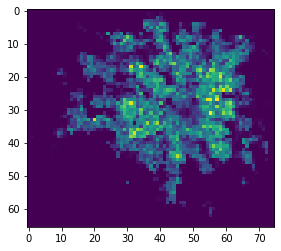

In [9]:
# plot city population 
plt.imshow(out_image[0,:,:])
plt.show()

In [10]:
# since the raster array contains many dimensions, we assign the dimension containing the population density data to a new 
# variable
pop_density = out_image[0,:,:]
pop_density

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [11]:
# just in case, set all negative values to zero
pop_density[pop_density < 0] = 0

In [12]:
# split city into 400 x 400 meter grid cells
geometry = city_proj['geometry'].iloc[0]
print(type(geometry))
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 400)
print(type(geometry_cut))

<class 'shapely.geometry.polygon.Polygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>


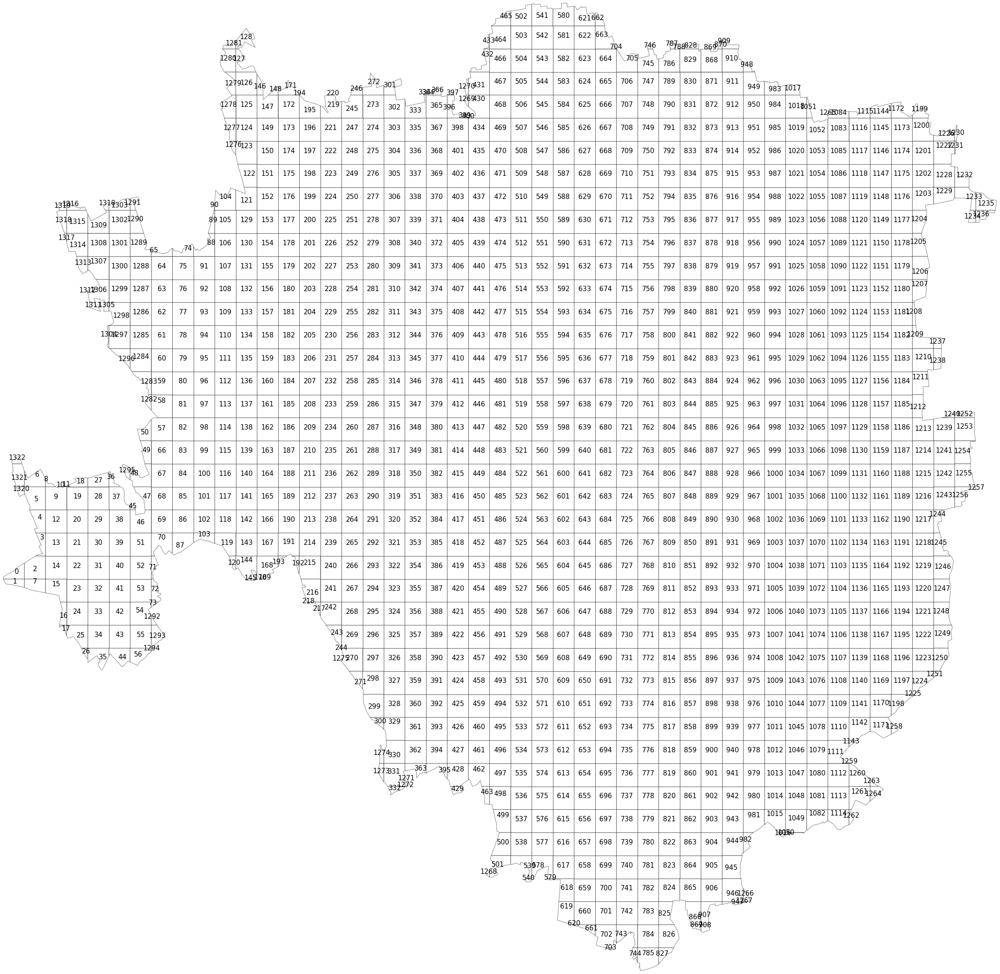

In [13]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city_proj.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [14]:
# create geodataframe from the square grid polygons
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_proj.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((503197.317 5032658.859, 503202.066 5..."
1,"POLYGON ((503591.542 5032635.490, 503591.542 5..."
2,"POLYGON ((503591.542 5032909.514, 503804.443 5..."
3,"POLYGON ((503804.443 5033029.836, 503837.189 5..."
4,"POLYGON ((503807.363 5033424.181, 503777.065 5..."


<AxesSubplot:>

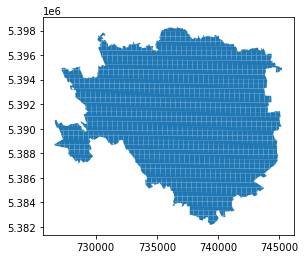

In [15]:
# convert to the NASA crs we introduced earlier
polyframe= polyframe.to_crs(city.crs)
polyframe.plot()

In [16]:
# load library for aggregating raster data into vector polygons
from rasterstats import zonal_stats

In [17]:
# compute the mean value of all raster values that fall into a given quadratic cell

affine = out_transform
city_stats = zonal_stats(polyframe, pop_density, affine=affine, stats='mean', nodata=0)
pop_array = np.array([list(item.values())[0] if list(item.values())[0] is not None else 0 for item in city_stats])
print(pop_array)

[40.32780457  4.24924612  0.74573342 ...  2.20441222  0.
  0.        ]


In [18]:
city_stats[:10]

[{'mean': 40.32780456542969},
 {'mean': 4.249246120452881},
 {'mean': 0.745733417570591},
 {'mean': 2.713408946990967},
 {'mean': None},
 {'mean': 24.005563735961914},
 {'mean': 0.096488818526268},
 {'mean': 0.8694548010826111},
 {'mean': None},
 {'mean': 3.5187740325927734}]

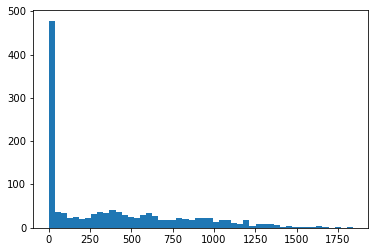

In [19]:
# plot histogram of the obtained population density values
plt.hist(pop_array, bins=50)
plt.show()

As we can see, it's a skewed distribution, with most locations having a small population, while a few locations at the tail of th distributions containing a large population.

In [20]:
# assign the population values as a new column in the geodataframe with the grid cells, 
# so we know which grid cell has what population.

polyframe["population"] = pop_array
polyframe.head()

,geometry,population
0,"POLYGON ((726632.539 5388716.142, 726636.552 5...",40.327805
1,"POLYGON ((727039.421 5388693.181, 727050.077 5...",4.249246
2,"POLYGON ((727019.603 5388959.985, 727229.731 5...",0.745733
3,"POLYGON ((727229.731 5389077.013, 727262.051 5...",2.713409
4,"POLYGON ((727204.215 5389460.956, 727168.253 5...",0.000000


(256, 4)
[[1.         0.96078431 0.94117647 1.        ]
 [0.99987697 0.95820069 0.93748558 1.        ]
 [0.99975394 0.95561707 0.93379469 1.        ]
 ...
 [0.41917724 0.00369089 0.05294887 1.        ]
 [0.4115494  0.00184544 0.05196463 1.        ]
 [0.40392157 0.         0.05098039 1.        ]]


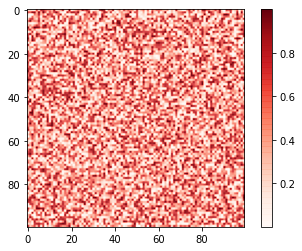

In [21]:
# in order to achieve a nice-looking visualisation, let's create a custom colormap, that fades away into transparency

ncolors = 256
# get cmap
color_array = plt.get_cmap('Reds')(range(ncolors))
print(color_array.shape)
print(color_array)

# change alpha values
color_array[:, -1] = np.linspace(0.3, 1, ncolors)

# create colormap object
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

map_object = LinearSegmentedColormap.from_list(name="Reds_transp", colors=color_array)

# register the colormap object
plt.register_cmap(cmap=map_object)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap='Reds_transp')
plt.colorbar(mappable=h)

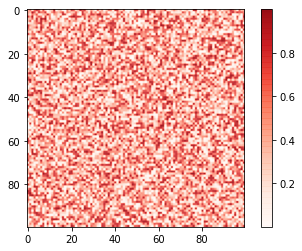

In [22]:
# let's cut it at the top for a better visual impact

def trunc_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list('trunc({n}, {a:.2f}, {b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                                                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Reds_transp')
new_cmap = trunc_colormap(cmap, 0.0, .9)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap=new_cmap)
plt.colorbar(mappable=h)

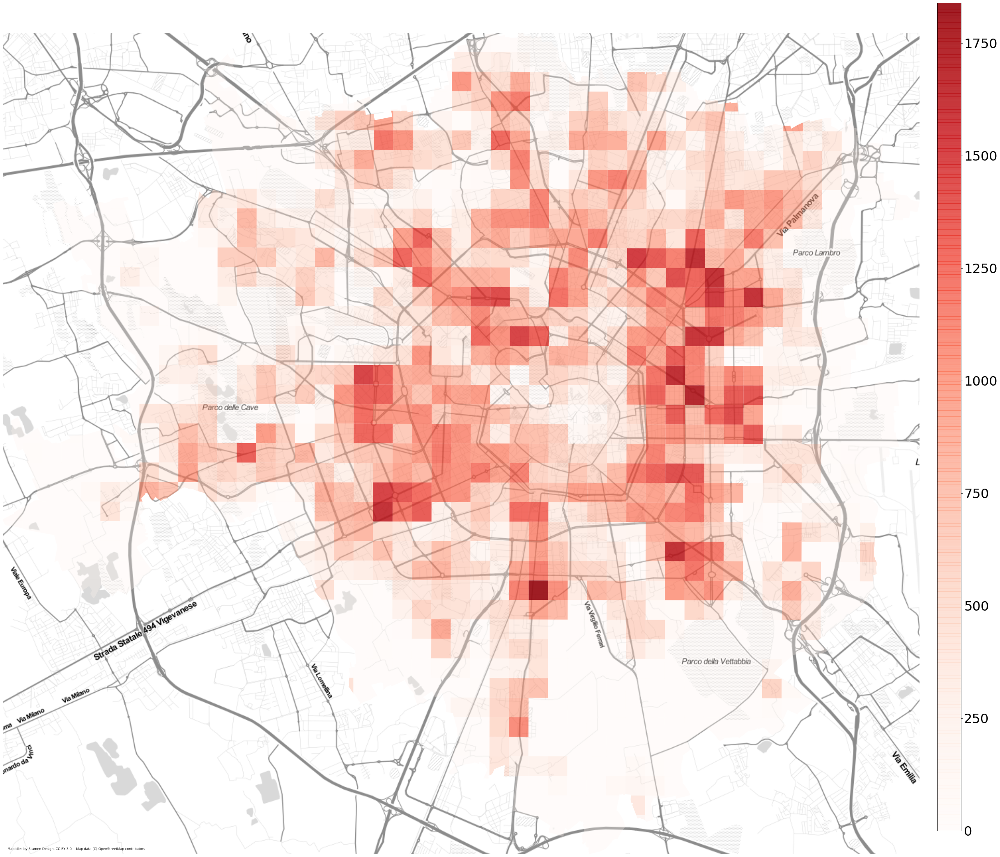

In [23]:
# plot the population density data on a map background
plt.rcParams.update({'font.size':32})
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

#ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

### Loading the street network

Now, let's move on to downloading the underlying street network as a `networkx` object by using the `osmnx` Python package.

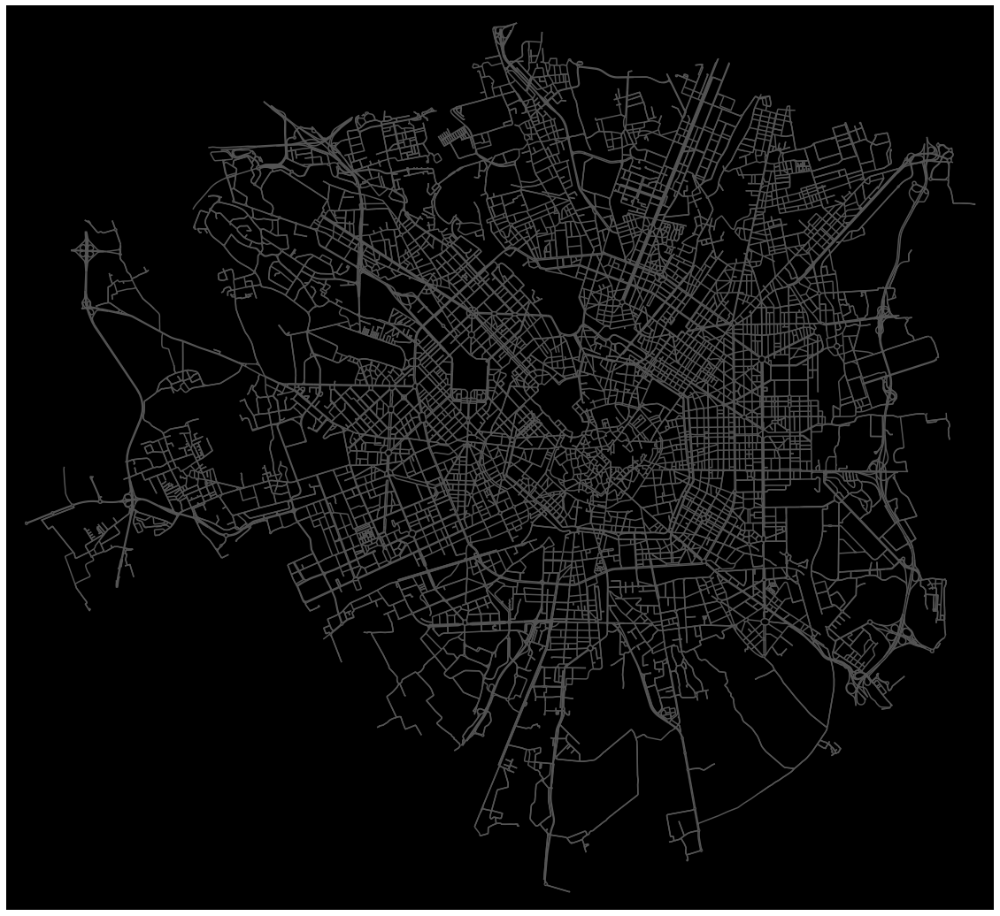

In [24]:
# download and project a street network
G = ox.graph_from_place(city_name, network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, figsize=(20,20), bgcolor='k', node_size=0, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

In [25]:
# set new coordinate reference system
from pyproj import CRS
crs = CRS.from_epsg(4326) # GPS coordinate system
polyframe_gps = polyframe.to_crs(crs)
print(polyframe_gps.crs)

epsg:4326


Now, let's overlay the street network on top of the population data for a visually pleasing result.

<ipython-input-26-af18cd3c6ffd>:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


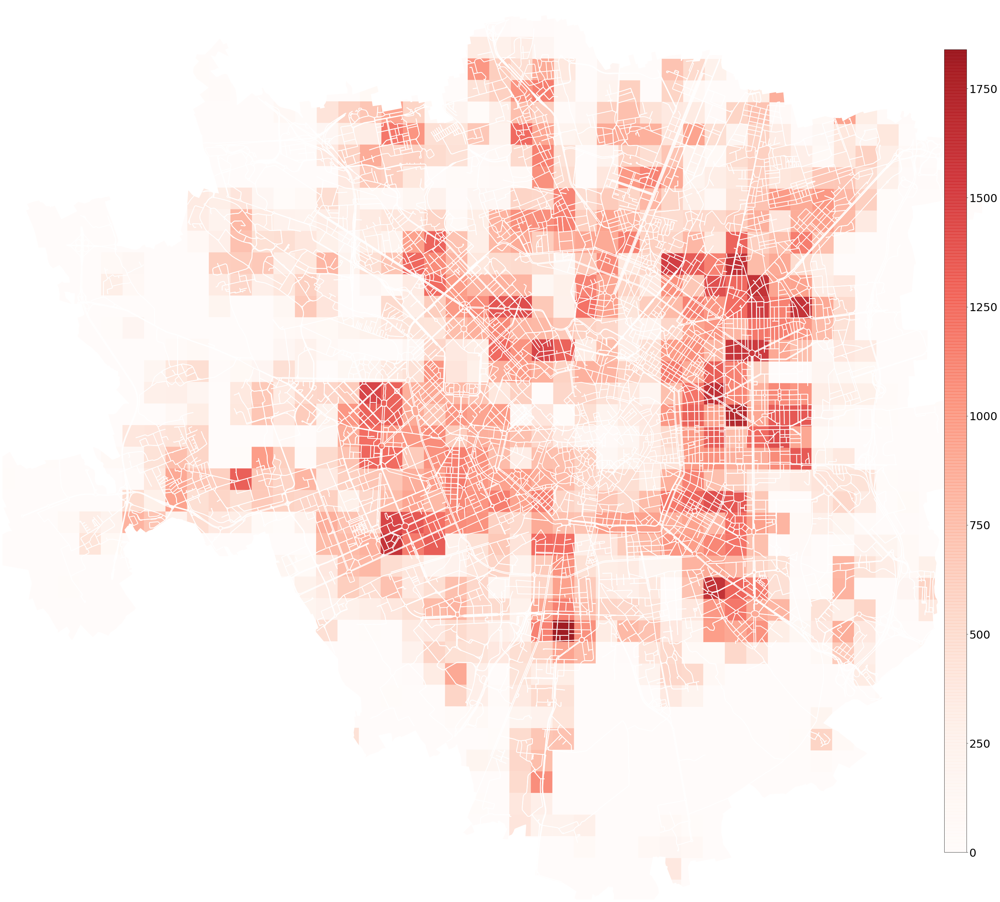

In [26]:
fig, ax = plt.subplots(figsize=(40,40))

#plt.close()
polyframe_gps.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

ox.plot_graph(G, ax=ax, figsize=(40,40),show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=2.25, node_alpha=0.8, node_zorder=10, edge_color='white')

cbax = fig.add_axes([0.95, 0.1, 0.0225, 0.8])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_gps.population), vmax=max(polyframe_gps.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.axis('off')
plt.tight_layout()
#plt.savefig('../data/Milan_pop_density_with_streets.jpg', dpi=150)
plt.show()

### Street network density

In [27]:
# let's get a list containing the street network node IDs
graph = G.nodes(data=True)
nodelist = [x[0] for x in graph]
nodelist[:10]

[10371529,
 10371530,
 13595397,
 13598756,
 13598788,
 13919619,
 13919627,
 13919638,
 13919640,
 13919646]

In [28]:
# then, we create a dataframe containing features of the street nodes (junctions)
from tqdm import tqdm
street_dict = {'osmid':[], 'lon':[], 'lat':[], 'street_count':[]}
for node in tqdm(nodelist):
    street_dict['osmid'].append(node)
    street_dict['lon'].append(graph[node]['x'])
    street_dict['lat'].append(graph[node]['y'])
    street_dict['street_count'].append(graph[node]['street_count'])
    
street_frame = pd.DataFrame(street_dict)
street_frame.head(10)

100%|██████████████████████████████████████████████████████████████████████| 13074/13074 [00:00<00:00, 318869.64it/s]


,osmid,lon,lat,street_count
0,10371529,9.076625,45.487563,3
1,10371530,9.102055,45.479804,3
2,13595397,9.130656,45.499516,4
3,13598756,9.163773,45.482751,4
4,13598788,9.157376,45.487319,3
5,13919619,9.156166,45.484810,3
6,13919627,9.157687,45.487773,5
7,13919638,9.160314,45.490487,3
8,13919640,9.153752,45.486130,4
9,13919646,9.165737,45.490573,4


In [29]:
# let's create Point geometries from the lat, lon pairs. You have seen this many times before
geometry = [Point(xy) for xy in zip(street_frame.lon, street_frame.lat)]
street_frame = street_frame.drop(['lon', 'lat'], axis=1)
gdf = gpd.GeoDataFrame(street_frame, crs=crs, geometry=geometry)
gdf.tail()

,osmid,street_count,geometry
13069,8856646224,4,POINT (9.25557 45.44725)
13070,8856646251,3,POINT (9.24014 45.44010)
13071,8871204317,3,POINT (9.15331 45.49522)
13072,8871204319,3,POINT (9.15379 45.49485)
13073,8930784140,4,POINT (9.14381 45.45416)


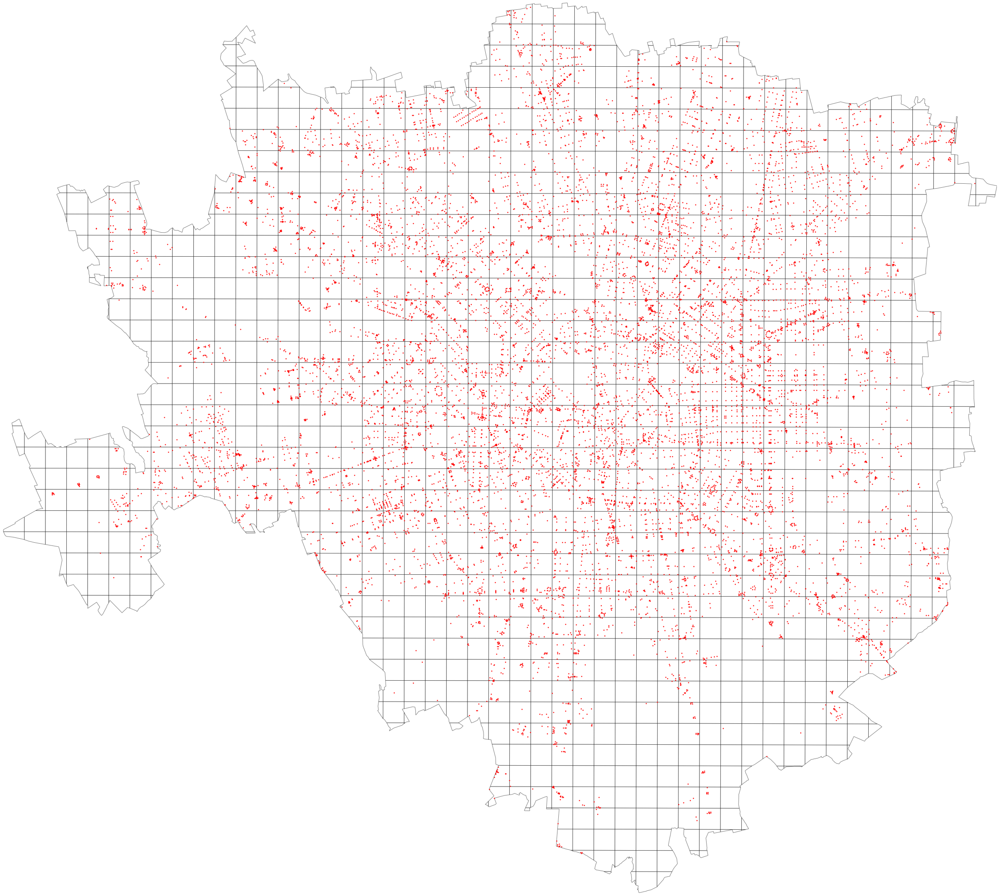

In [30]:
west, south, east, north = polyframe_gps.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(polyframe_gps.geometry, np.arange(len(polyframe_gps))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)
gdf.plot(ax=ax, color='red', markersize=2, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

Now, we will start computing the street node density aggregated by the quadratic cells the city has been divided into.

In [31]:
pointInPoly = gpd.sjoin(polyframe_gps, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

13063


,geometry,population,index_right,osmid,street_count
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,5098,273512549,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10030,2268397492,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,11001,2720117948,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,11002,2720117950,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10039,2268397749,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10032,2268397617,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10035,2268397659,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,10040,2268397755,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,7107,595649878,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,10042,2268397862,3


In [32]:
streetcounts = pointInPoly.groupby(pointInPoly.index)['index_right'].count()
counts = pd.DataFrame(streetcounts)
counts.columns = ['counts']
counts

,counts
13,7
20,8
27,1
29,8
31,1
...,...
1300,4
1301,10
1302,8
1305,1


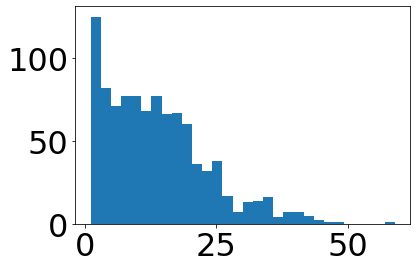

In [33]:
# a quick histogram of the street node counts
plt.hist(counts.counts, bins=30)
plt.show()

In [34]:
polycounts = polyframe_gps.copy()
polycounts['counts'] = counts.counts
polycounts['counts'].fillna(0, inplace=True)
polycounts['counts'] = polycounts['counts'].astype(int)
polycounts

,geometry,population,counts
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0
...,...,...,...
1318,"POLYGON ((9.05555 45.50047, 9.05543 45.50074, ...",0.000000,0
1319,"POLYGON ((9.05440 45.50402, 9.05385 45.50486, ...",0.656113,0
1320,"POLYGON ((9.04594 45.46031, 9.04475 45.45995, ...",2.204412,0
1321,"POLYGON ((9.04404 45.46143, 9.04297 45.46369, ...",0.000000,0


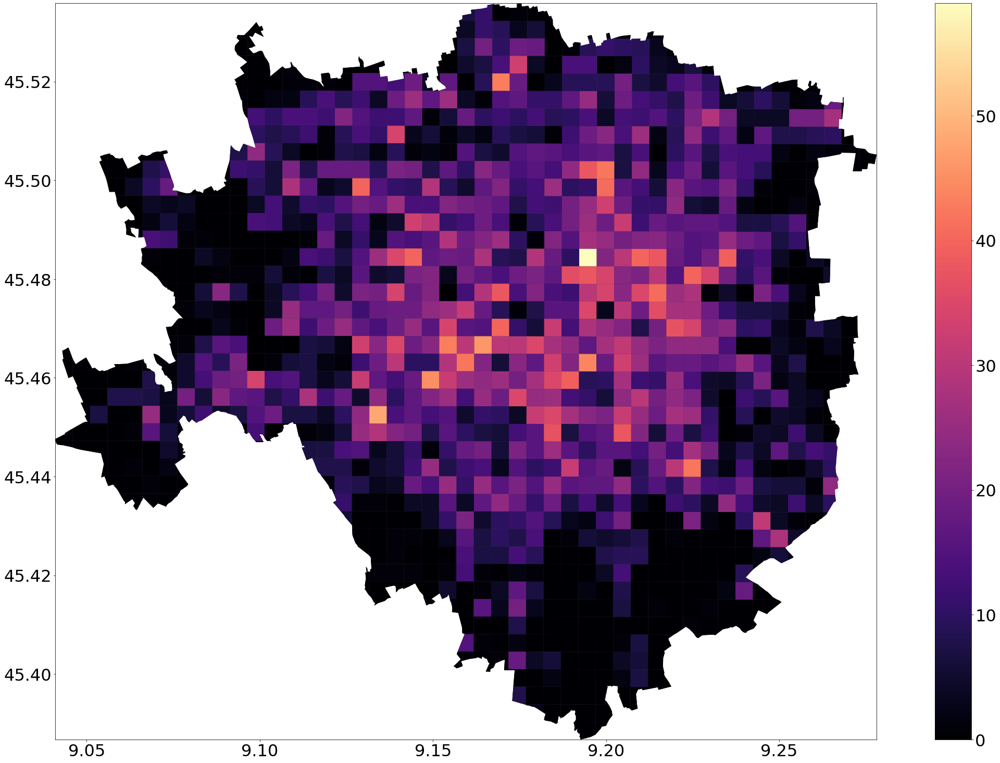

In [35]:
# plot the city street network density
west, south, east, north = polycounts.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polycounts.plot(column='counts',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

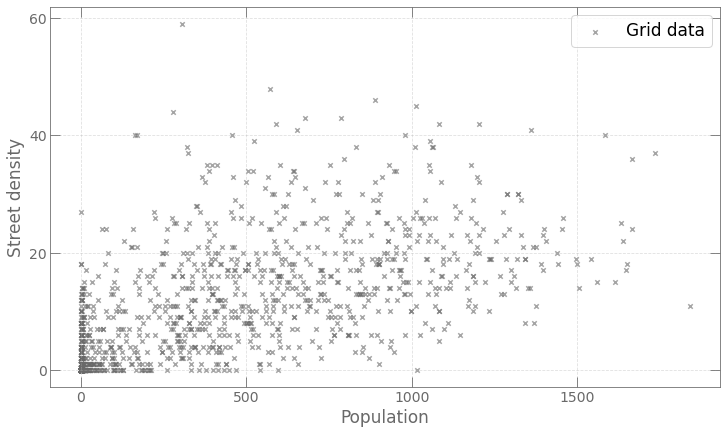

In [36]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(polycounts.population, polycounts.counts, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', label = "Grid data", s=20)

ax.legend(prop={'size': 17})
plt.xlabel('Population', size=17, color='dimgrey')
plt.ylabel('Street density', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
plt.show()

We can visually identify a weak correlation between population density and street network density in Milan. We can thus create our **first measure** of this project: the **correlation** between the population and street density:

In [37]:
np.corrcoef(polycounts.population, polycounts.counts)[0, 1]

0.6492601452615582

For our case study, we have a correlation coefficient of 0.65! We can use this measure to compare different cities. 

### Urban accessibility

We will use the Python `pandana` package for urban accessibility analysis. However, we will extend and develop the `pandana` accessibility measure further to include a correction for population density.

In [38]:
import pandana

We will load street networks directly from OpenStreetMap using `pandana` functionality.
This requires installing a Pandana extension called OSMnet.

* conda install osmnet or pip install osmnet

In [39]:
from pandana.loaders import osm

import warnings
warnings.filterwarnings('ignore')

We will use the [pandana.loaders.osm.pdna_network_from_bbox()](http://udst.github.io/pandana/loaders.html#openstreetmap-api) function for loading our example city network.

In [40]:
# get bounding box of city first
west, south, east, north = polycounts.unary_union.bounds
print(west, south, east, north)

9.040886699999996 45.386738099999974 9.278110299999996 45.53584819999999


In [41]:
network = osm.pdna_network_from_bbox(south, west, north, east)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](45.38673810,9.04088670,45.53584820,9.27811030);>;);out;'}"
Downloaded 51,350.4KB from www.overpass-api.de in 9.34 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 26.63 seconds
Returning OSM data with 304,576 nodes and 86,377 ways...
Edge node pairs completed. Took 116.50 seconds
Returning processed graph with 100,999 nodes and 147,157 edges...
Completed OSM data download and Pandana node and edge table creation in 152.86 seconds


In [42]:
network.nodes_df.head()

,x,y
id,,
10371529,9.076625,45.487563
10371530,9.102055,45.479804
13595397,9.130656,45.499516
13598756,9.163773,45.482751
13598788,9.157376,45.487319


In [43]:
network.edges_df.head()

from          to    distance
10371529 743371622   10371529   743371622  150.145208
         743371634   10371529   743371634  154.478305
10371530 2754112526  10371530  2754112526   30.262968
13595397 344814479   13595397   344814479   17.388362
13598756 2661005332  13598756  2661005332   23.940970

### How many restaurants are there within 500 meters of each node?

Let's load the restaurant data from OpenStreetMap:

In [44]:
restaurants = osm.node_query(
    south, west, north, east, tags='"amenity"="restaurant"')

In [45]:
restaurants.head()

,lat,lon,amenity,name,fixme,cuisine,addr:city,addr:country,addr:housenumber,addr:postcode,...,phone:mobile,opening_hours:kitchen,wikidata,wikimedia_commons,wikipedia,delivery:deliveroo,ref:delivery:deliveroo,opening_hours:takeaway,payment:apple_pay,ref:justeat
id,,,,,,,,,,,,,,,,,,,,,
29978508,45.461301,9.154473,restaurant,La Brasserie de Milan,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91533563,45.460429,9.175277,restaurant,Ancora,posizione,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
258076664,45.488549,9.165327,restaurant,La Mela Bianca,NaN,italian;pizza,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
260349649,45.491012,9.239116,restaurant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
260349669,45.491240,9.244445,restaurant,NU,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Computing the number of restaurants **accessible** within a network radius of 500 meters is done as a `pandana` _aggregation_ operation. It requires passing a list of network nodes and associated values.
In this case, the "value" is just presence or absence of a restaurant.

In [46]:
restaurant_nodes = network.get_node_ids(restaurants.lon, restaurants.lat)
network.set(restaurant_nodes, 
            name = 'restaurants')

Now we can run the query with [network.aggregate()](http://udst.github.io/pandana/network.html#pandana.network.Network.aggregate):

In [47]:
accessibility = network.aggregate(distance = 500,
                                  type = 'count',
                                  name = 'restaurants')
accessibility.describe()

count    100999.000000
mean         10.047030
std          15.227869
min           0.000000
25%           0.000000
50%           3.000000
75%          13.000000
max          87.000000
dtype: float64

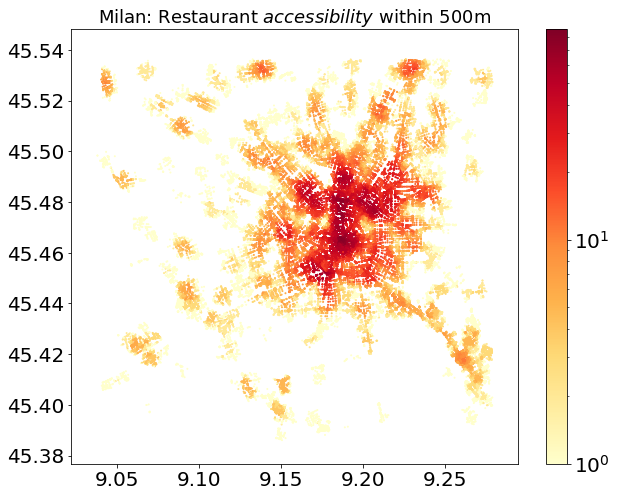

In [48]:
import matplotlib
plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(10,8))

plt.title('Milan: Restaurant $accessibility$ within 500m', size = 18)
plt.scatter(network.nodes_df.x, network.nodes_df.y, 
            c=accessibility, s=1, cmap='YlOrRd', 
            norm=matplotlib.colors.LogNorm())
cb = plt.colorbar()

plt.show()

In [49]:
network_nodes = network.nodes_df
network_nodes.head()

,x,y
id,,
10371529,9.076625,45.487563
10371530,9.102055,45.479804
13595397,9.130656,45.499516
13598756,9.163773,45.482751
13598788,9.157376,45.487319


In [50]:
network_nodes["accessibility"] = accessibility
network_nodes.head()

,x,y,accessibility
id,,,
10371529,9.076625,45.487563,0.0
10371530,9.102055,45.479804,1.0
13595397,9.130656,45.499516,8.0
13598756,9.163773,45.482751,43.0
13598788,9.157376,45.487319,16.0


In [51]:
# let's create Point geometries from the lat, lon pairs.
geometry = [Point(xy) for xy in zip(network_nodes.x, network_nodes.y)]
network_nodes = network_nodes.drop(['x', 'y'], axis=1)
network_gdf = gpd.GeoDataFrame(network_nodes, crs=crs, geometry=geometry)
network_gdf.head()

,accessibility,geometry
id,,
10371529,0.0,POINT (9.07662 45.48756)
10371530,1.0,POINT (9.10206 45.47980)
13595397,8.0,POINT (9.13066 45.49952)
13598756,43.0,POINT (9.16377 45.48275)
13598788,16.0,POINT (9.15738 45.48732)


Now, we will aggregate the node restaurant accessibility by the quadratic cells we had divided the city into.

In [52]:
pointInPoly = gpd.sjoin(polyframe_gps, network_gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

73471


,geometry,population,index_right,accessibility
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,4634855005,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,4634855007,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,4634855008,0.0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,2786370504,0.0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,4629639627,0.0
5,"POLYGON ((9.04718 45.45788, 9.04708 45.45803, ...",24.005564,2720117963,0.0
7,"POLYGON ((9.05097 45.44723, 9.05097 45.44510, ...",0.869455,2093536135,0.0
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,2268397749,0.0
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,2268397617,0.0
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,2268397659,0.0


In [64]:
aggr_access = pointInPoly.groupby(pointInPoly.index)['accessibility'].mean()
aggr_access_df = pd.DataFrame(aggr_access)
aggr_access_df.columns = ['aggr_access']
aggr_access_df

,aggr_access
2,0.0
3,0.0
4,0.0
5,0.0
7,0.0
...,...
1312,1.0
1313,0.0
1314,0.0
1315,0.0


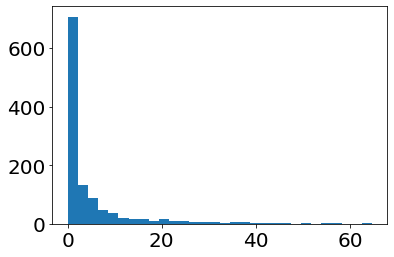

In [65]:
# a quick histogram of the aggregated accessibility
plt.hist(aggr_access_df.aggr_access, bins=30)
plt.show()

In [66]:
polyaccess = polyframe_gps.copy()
polyaccess['aggr_access'] = aggr_access_df.aggr_access
polyaccess['aggr_access'].fillna(0, inplace=True)
#polyaccess['aggr_access'] = polyaccess['aggr_access'].astype(int)
polyaccess

,geometry,population,aggr_access
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0.0
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0.0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0.0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0.0
...,...,...,...
1318,"POLYGON ((9.05555 45.50047, 9.05543 45.50074, ...",0.000000,0.0
1319,"POLYGON ((9.05440 45.50402, 9.05385 45.50486, ...",0.656113,0.0
1320,"POLYGON ((9.04594 45.46031, 9.04475 45.45995, ...",2.204412,0.0
1321,"POLYGON ((9.04404 45.46143, 9.04297 45.46369, ...",0.000000,0.0


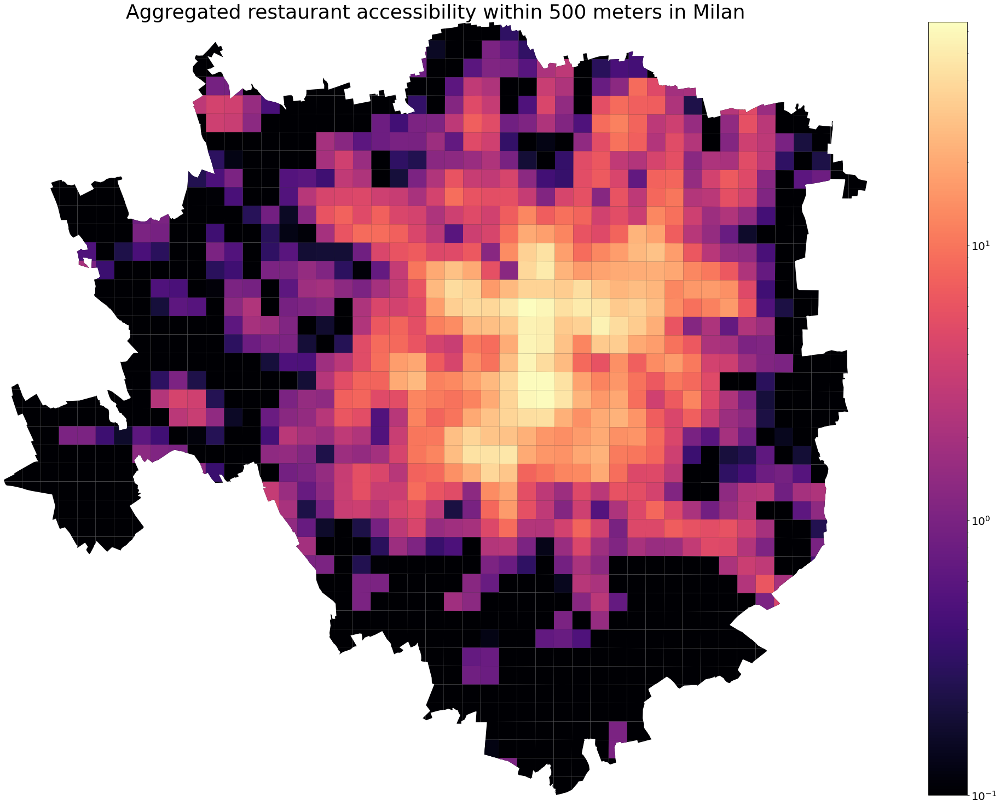

In [67]:
# plot the city aggregated accessibility

LOGMIN = 0.1  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='aggr_access',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Aggregated restaurant accessibility within 500 meters in Milan", size = 36)
ax.axis('off')
plt.show()

In [68]:
polyaccess["pop_int"] = polyaccess.population.astype(int) + 1
polyaccess.head()

,geometry,population,aggr_access,pop_int
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0.0,41
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0.0,5
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0.0,1
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0.0,3
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0.0,1


### Correcting accessibility for population density

Let's now finally complete the operation necessary for achieving our objective stated in the introduction to the project: **accounting for the population that is actually served** by the amenity we are computing the accessibility measure for. We do this simply by normalising our aggregated accessibility measures we computed by the population density at that spatial unit:

In [69]:
polyaccess["access_normalised"] = polyaccess.aggr_access / polyaccess.pop_int 
polyaccess.head()

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0.0,41,0.0
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0.0,5,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0.0,1,0.0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0.0,3,0.0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0.0,1,0.0


In [70]:
Milan_access_measure = polyaccess.access_normalised.mean()
Milan_access_measure

0.0714886058797214

Let's plot the restaurant accessibility normalised by population density:

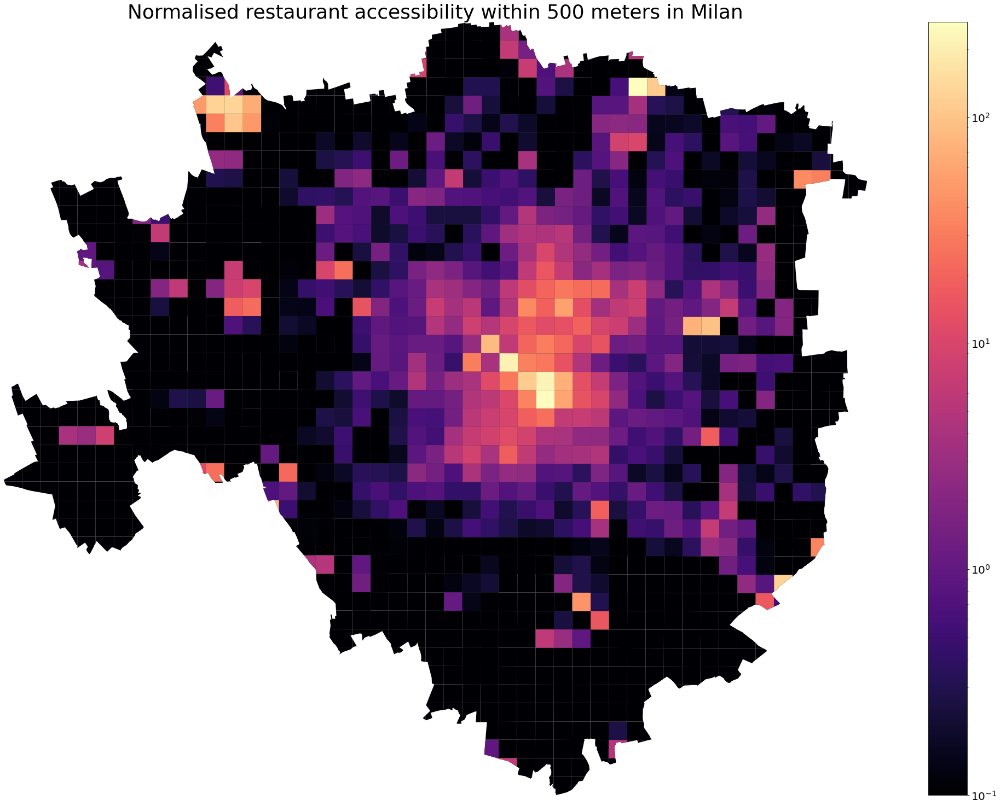

In [59]:
LOGMIN = 0.1  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='access_normalised',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), LOGMIN), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Normalised restaurant accessibility within 500 meters in Milan", size = 36)
ax.axis('off')
plt.show()

Let's plot the accessibility computed using conventional methods and the accessibility computed by taking into account population density next to each other to compare and draw conclusions:

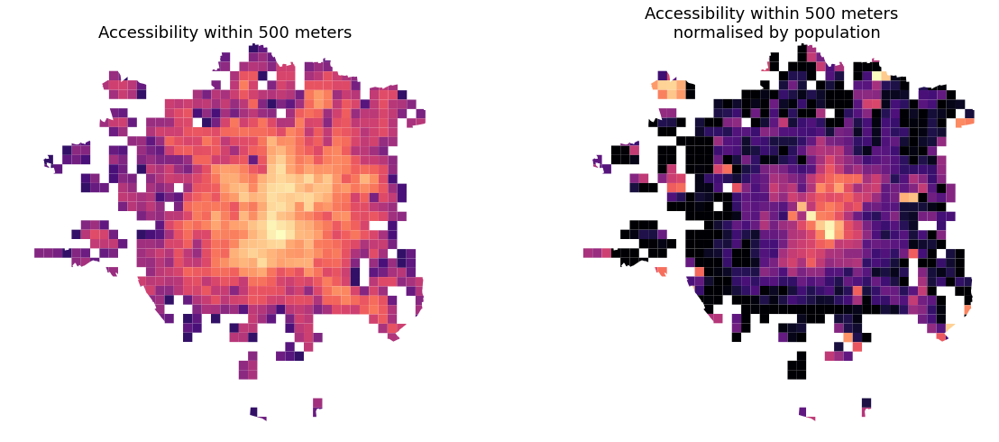

In [60]:
f, ax = plt.subplots(1,2,figsize=(20,8))

polyaccess.plot(column='aggr_access', ax = ax[0], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma')   
  
ax[0].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("Accessibility within 500 meters", size = 18)


polyaccess.plot(column='access_normalised', ax = ax[1], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), LOGMIN), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma')

ax[1].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Accessibility within 500 meters \n normalised by population", size = 18)
ax[0].axis('off')
ax[1].axis('off')
plt.show()

## Conclusion

In this project, we combined city street network data, amenity data, and publically available high-resolution population grid data to 

* find out whether there is a correlation between population density and street network density. For historically organically grown cities such as Milan, street network density indeed seems to correlate with population density - we discovered a correlation coefficient of 0.65! However, for other, modern cities, this needs to be additionally verified. We have provided the theoretical and technical methodology for conducting such an analysis.

* develop a more realistic **urban accessibility measure** that takes into account population densities and hence offers a more accurate measure of accessibility, since an urban amenity accessible to 500 people is very different from the same amenity being accessible to 5000 people, as in the latter case, there might not be enough amenities to serve such a big number of people. This will result in **less** accessibility as a consequence. 

And indeed, by conducting an accessibility analysis using conventional tools and comparing it with the population-normalised accessibility measure we developed, we see a dramatic difference. In particular, since there is a significant urban population in the peripheric districts of the city but not so many amenities (restaurants in our case study) in those locations, the accessibility drops considerably as a consequence in the periphery of the city, even though conventional accesibility measures showed good accessibility for those locations. 

We also note that for a few locations quite distant from the city center, we see a situation in which the population density is low, while there are relatively many amenities there, which causes the accessibility in those areas to become **high**.

Overall, the urban accessibility measure we developed in this project, which combines conventional accessibility measures with high-resolution population density data, offers a more accurate method for measuring accessibility in cities, and can be directly applied to any city in the world, since all the data used in this project is publically available.

## Homework Assignment

Conduct the above analysis for any other city of your choice, making sure you pick one for which the NASA population density data has a fine enough resolution.

Complete the assignment in a clean Jupyter Notebook, name the notebook **< Name > < Surname > Class 9 Homework** and upload it to Moodle.